Geospatial Analysis and representation for data science exam, 15-01-2021

Elena Zordan, student number 211663

M.Sc. Data Science, University of Trento

# Airbnb analysis on Bristol, England
1. choose one of the cities available from the InsideAirbnb - retrieve data on neighbourhoods (city data portal)
2. view statistical information on neighbourhoods (city data portal) - identify which are the neighbourhoods with the highest prices in Airbnb
3. identify which are the districts with the greatest number of tourist activities (city data portal and/or openstreetmap)
4. find the location of 3 Airbnb hosts closest to one of the city's museums (on walking distance) (city data portal and/or openstreetmap)
5. of the three hosts, identify which one has the greatest number of services (supermarkets, pharmacies, restaurants) in an area of 300m (city data portal and/or openstreetmap - analyze and test spatial autocorrelation of price
6. represent these analyses on maps (web and not)

## Libraries

In [34]:
import pandas as pd 
import geopandas as gpd
import rtree
import folium 
import matplotlib.pyplot as plt 
import pygeos
import pyrosm 
import contextily as ctx 
from geopy.geocoders import Nominatim
from branca.element import Figure 
import seaborn as sns 
from pyrosm.data import sources
import osmnx as ox 
from shapely.geometry import Point,LineString 
import pyproj
from shapely.ops import transform

# 1) Retrieve data on neighbourhoods


Load the data and create the first geodataframe.


In [2]:
csv = pd.read_csv("listings.csv")

#select a subset with useful columns 
df = csv[["id","name", "neighbourhood_cleansed", "latitude","longitude", "price"]]

#modify price column (remove '£' and commas)
df.price = df.price.apply(lambda c: float(c[1:].replace(',','')))

#create geodataframe of the df with the WGS84 (epsg=4326, so with latitude and longitude) coordinate reference system
geodf = gpd.GeoDataFrame(
                df,
                crs='EPSG:4326',
                geometry=gpd.points_from_xy(csv.longitude, csv.latitude))



/Users/elenazordan/Desktop/corsi ds/Geospatial/env/lib/python3.8/site-packages/pandas/core/generic.py:5489: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


#### Data preparation for R (see point n.5.1)

In [3]:
#data preparation for R session
geodf

prova1 = gpd.read_file("wards/")

newgdf = geodf.merge(prova1, left_on='neighbourhood_cleansed', right_on='name')
newgdf.rename(columns = {'name_x':'AirBnB', 'neighbourhood_cleansed':'neighbourhood'}, inplace = True) 

newgdf = newgdf.drop(['geometry_x', 'geometry_y'], axis=1)


#newgdf.head()

In [4]:
#create geodataframe of the df with the WGS84 (epsg=4326, so with latitude and longitude) coordinate reference system
newgdf = gpd.GeoDataFrame(
                newgdf,
                crs='EPSG:4326',
                geometry=gpd.points_from_xy(newgdf.latitude, newgdf.longitude))

#newgdf 


In [5]:
newgdf.to_file("newgdf.shp") 
#end of data preparation for R session

In [46]:
geodf.head()

,id,name,neighbourhood_cleansed,latitude,longitude,price,geometry
0,70820,City View - Sarah's double room.,Windmill Hill,51.43994,-2.59173,30.0,POINT (-2.59173 51.43994)
1,117122,City Centre-Waterside Retreat,Clifton,51.45051,-2.61054,66.0,POINT (-2.61054 51.45051)
2,176306,The White Room - Central Bristol Art House Ga...,Bedminster,51.44101,-2.60121,29.0,POINT (-2.60121 51.44101)
3,307634,Peaceful Safe Home & Clear Space 'The Lilac Room',Easton,51.46641,-2.55533,30.0,POINT (-2.55533 51.46641)
4,322906,HUGE Room CENTRAL location House,Ashley,51.46668,-2.58274,69.0,POINT (-2.58274 51.46668)


From this GeoDataFrame, Bristol has 34 districts.

In [6]:
len(geodf.neighbourhood_cleansed.unique())  

34

In [7]:
#name of districts
geodf.neighbourhood_cleansed.unique()

array(['Windmill Hill', 'Clifton', 'Bedminster', 'Easton', 'Ashley',
       'Brislington West', 'Westbury-on-Trym & Henleaze', 'Redland',
       'Lawrence Hill', 'Southville', 'Eastville', 'Knowle',
       'Avonmouth & Lawrence Weston', 'Hotwells & Harbourside',
       'Henbury & Brentry', 'Clifton Down', 'Cotham', 'Southmead',
       'Stockwood', 'Brislington East', 'Horfield', 'Stoke Bishop',
       'Central', 'St George West', 'Frome Vale',
       'Bishopston & Ashley Down', 'Hillfields', 'Bishopsworth',
       'Lockleaze', 'Hartcliffe & Withywood',
       'Hengrove & Whitchurch Park', 'St George Central', 'Filwood',
       'St George Troopers Hill'], dtype=object)

Plot all the AirBnBs with map background using *contextily* 

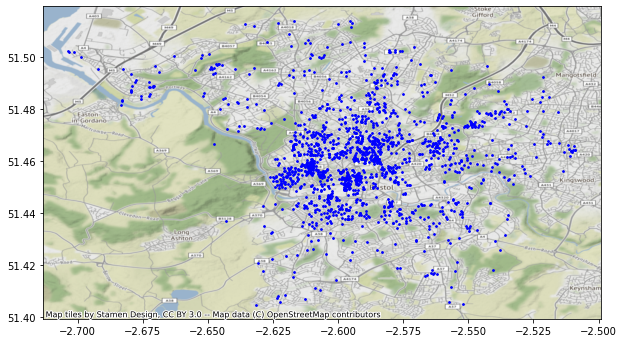

In [8]:
ax = geodf.plot(color='blue', figsize=(10,10), markersize=3)

#add background (I have chosen the default provider (OpenStreetMap))
ctx.add_basemap(ax, crs=geodf.crs.to_string()) 


In [48]:
# function to define the details of markers in the map
def getMarker(lat,lon, message,tip,iconstyle):
    marker = folium.Marker(location=[lat,lon],
                         popup=message,
                         tooltip=tip,
                        icon=iconstyle
                        )
    
    return marker


##### Webmapping all airbnb in Bristol
By cluster 

In [63]:
fig_airbnb = Figure(width=700,height=400)
map_airbnb =folium.Map(location=[point_city[0], point_city[1]],tiles='cartodbpositron',zoom_start=12) 

# marker cluster
marker_cluster = MarkerCluster().add_to(map_airbnb)

# specify the markers also using the previously defined function getMarker 
for index, row in geodf.iterrows():
    icon=folium.Icon(color='purple',prefix='fa',icon='arrow-circle-down')
    message = '<strong>name: '+ str(row['name']) 
    tip = message + '<br/>' 
    marker = getMarker(row['latitude'],row['longitude'],message, tip, iconstyle=None)
    #add to marker cluster 
    marker.add_to(marker_cluster)

# add to figure and plot
fig_airbnb.add_child(map_airbnb)
map_airbnb



<AxesSubplot:>

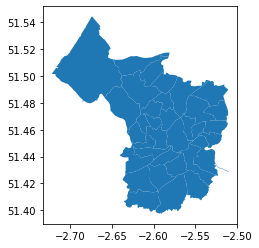

In [9]:
#import .geojson file (neighbourhoods) in order to plot it 

geo_districts = gpd.read_file("neighbourhoods.geojson")
geo_districts.plot()

##### Bristol map

Use *Folium* (wembapping) and *Nominatim* to find out the coordinate of Bristol (which are: (51.4538022, -2.5972985) )

In [10]:
geolocator = Nominatim(user_agent="Mozilla/5.0 (Linux; Android 10) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Mobile Safari/537.36")
location = geolocator.geocode("Bristol, England")
point_city = (location.latitude, location.longitude)

point_city # (51.4538022, -2.5972985)

map0 = folium.Map(location=[point_city[0], point_city[1]], zoom_start=11.5)
map0 




Overimpose the districts with folium

In [11]:
fig_districts = Figure(width=700,height=300)
districts =folium.Map(location=[point_city[0], point_city[1]],tiles='openstreetmap',zoom_start=10) 

folium.GeoJson(
    geo_districts
    ).add_to(districts)

fig_districts.add_child(districts)

In [12]:
geo_districts.head()

,neighbourhood,neighbourhood_group,geometry
0,Windmill Hill,None,"MULTIPOLYGON (((-2.60518 51.43439, -2.60484 51..."
1,Filwood,None,"MULTIPOLYGON (((-2.60773 51.43330, -2.60717 51..."
2,Southmead,None,"MULTIPOLYGON (((-2.61573 51.50247, -2.61529 51..."
3,Easton,None,"MULTIPOLYGON (((-2.56793 51.46887, -2.56787 51..."
4,Brislington East,None,"MULTIPOLYGON (((-2.55795 51.44962, -2.55785 51..."


# 2

## 2.1) Statistical info on neighborhoods

City data portal of Bristol (source of Bristol open data: https://opendata.bristol.gov.uk/pages/homepage/ )


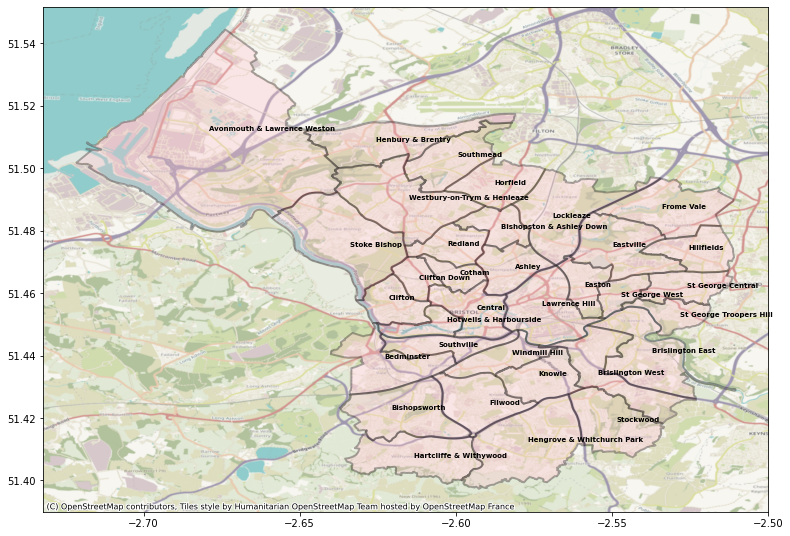

In [35]:
# plot (again) the districts with names
ax = geo_districts.plot(figsize=(13, 13), facecolor="pink", alpha=0.3, edgecolor="black", linewidth=2)
texts = []

for p, label in zip(geo_districts.geometry.representative_point(), geo_districts.neighbourhood):
    texts.append(plt.text(p.x, p.y, label, fontsize = 7, color="black",fontweight='bold'))

ctx.add_basemap(ax,crs=geodf.crs.to_string(), source=ctx.providers.OpenStreetMap.HOT)

Load Bristol open data obtained from Bristol *city data portal*

In [67]:
#1
estim_pop_by_ward = gpd.read_file('estim_pop_by_ward/')
#2
ethnicity_by_ward = gpd.read_file("ethnicity_by_ward/")
#3
pop_bysex_by_ward = pd.read_csv("pop_sex_by_ward.csv", delimiter=";")

#estim2016_pop_by_ward
#pop_bysex_by_ward
#ethnicity_by_ward


In particular, these 3 dataset are:

### 1st: Estim_pop_by_ward

This geodataframe contains the estimated population of Bristol by district.


The estimated resident population of an area includes all those people who usually live there, including students at their term time address.
Arriving international migrants are included if they remain in the UK for at least a year. Emigrants are excluded if they remain outside the UK for at least a year.

In [16]:
# data cleaning and data preparation
estpop_groupedbyward = estim_pop_by_ward.groupby(['ward_2016_n','population_']).mid_year.max().to_frame('most recent year').reset_index().sort_values(['most recent year', 'ward_2016_n'], ascending=False)
estpop_groupedbyward = estpop_groupedbyward[['ward_2016_n','population_']].head(34).sort_values(['ward_2016_n'], ascending=True).reset_index()

pop_by_ward = estim_pop_by_ward.merge(estpop_groupedbyward, left_on='population_', right_on='population_')
pop_by_ward = pop_by_ward[pop_by_ward.mid_year=='2019'].drop(['ward_2016_c', 'index','ward_2016_n_y'],axis=1).sort_values(['population_'],ascending=False).reset_index(drop=True)



pop_by_ward['percentage'] = round(pop_by_ward.population_/sum(pop_by_ward.population_)*100,1)

pop_by_ward.head()



,ward_2016_n_x,mid_year,population_,geometry,percentage
0,Central,2019,21762.0,"POLYGON ((-2.58195 51.44754, -2.58196 51.44754...",4.7
1,Avonmouth & Lawrence Weston,2019,21408.0,"POLYGON ((-2.72171 51.50167, -2.72144 51.50189...",4.6
2,Westbury-on-Trym & Henleaze,2019,19806.0,"POLYGON ((-2.61573 51.50246, -2.61584 51.50225...",4.3
3,Lawrence Hill,2019,19626.0,"POLYGON ((-2.58406 51.45963, -2.58339 51.45989...",4.2
4,Ashley,2019,19075.0,"POLYGON ((-2.57611 51.47583, -2.57603 51.47566...",4.1


##### Some visualisations

Barplot of the distribution of absolute value of population among districts

Text(0, 0.5, 'Population')

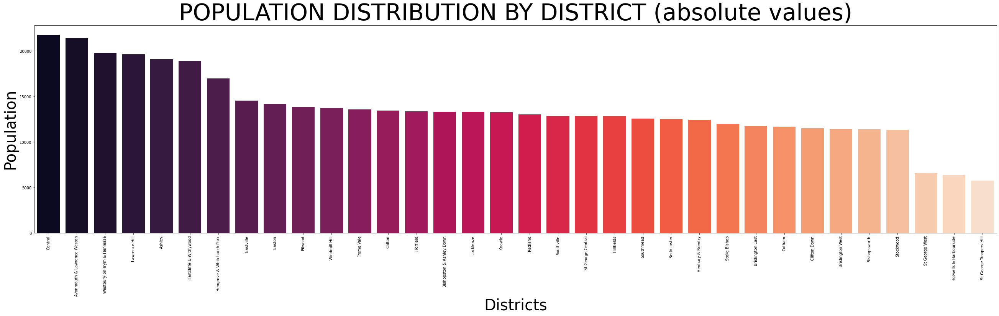

In [17]:
fig, ax = plt.subplots(figsize=(45,10))

g = sns.barplot(x = 'ward_2016_n_x', y = 'population_', data = pop_by_ward,
            palette = 'rocket',
            capsize = 0.05,             
            saturation = 8,             
            errcolor = 'gray', errwidth = 2,  
            ci = 'sd',
            ax=ax,
            
            )

ax.set_xticklabels(g.get_xticklabels(), rotation=90) 
ax.set_title("POPULATION DISTRIBUTION BY DISTRICT (absolute values)",fontsize=60)
ax.set_xlabel('Districts', fontsize=40)
ax.set_ylabel('Population', fontsize=40)




In [86]:
fig_pop =Figure(width=550,height=350)
map_pop =folium.Map(location=point_city,tiles='cartodbpositron',zoom_start=10.5)


choropleth = folium.Choropleth(
    geo_data=pop_by_ward,
    data = pop_by_ward,
    columns=['ward_2016_n_x', 'percentage'],
    key_on="feature.properties.ward_2016_n_x",
    fill_color='Reds',
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Percentage of population',
    smooth_factor=0).add_to(map_pop)

fig_pop.add_child(map_pop)

# Display Region Label
folium.LayerControl().add_to(map_pop)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['ward_2016_n_x'], labels=False)
)

map_pop


As it can be seen, the neighbourhood with highest population is the "Central"; however, there are seven 




### 2nd: Ethnicity by ward 
This geodataframe contains the number of the main ethnicities divided by district. 

It also show the overall ethinical groups of the city and of England and Wales.

In [19]:
#data cleaning and preparation
ethnicity_by_ward['other'] = ethnicity_by_ward.total_popul-(ethnicity_by_ward.total_white+ethnicity_by_ward.total_black+ethnicity_by_ward.indian+ethnicity_by_ward.chinese+ethnicity_by_ward.arab)
ethnicity_by_ward = ethnicity_by_ward[['name','total_white', 'total_black', 'indian', 'chinese', 'arab', 'other','total_popul', 'geometry']]
ethnicity_by_ward = ethnicity_by_ward.drop([3,35]).reset_index(drop=True)


In [20]:
ethnicity_by_ward.head()

,name,total_white,total_black,indian,chinese,arab,other,total_popul,geometry
0,Clifton,1070.0,1483.0,173.0,348.0,69.0,9824.0,12967.0,"POLYGON ((-2.62052 51.46598, -2.62051 51.46599..."
1,Hartcliffe & Withywood,409.0,889.0,50.0,14.0,13.0,16548.0,17923.0,"POLYGON ((-2.62874 51.41600, -2.62851 51.41598..."
2,Frome Vale,583.0,2306.0,216.0,81.0,41.0,8937.0,12164.0,"POLYGON ((-2.53433 51.49675, -2.53280 51.49629..."
3,St George Central,567.0,1881.0,253.0,53.0,11.0,9503.0,12268.0,"POLYGON ((-2.54152 51.45841, -2.54151 51.45842..."
4,Stoke Bishop,611.0,1036.0,166.0,132.0,30.0,9879.0,11854.0,"POLYGON ((-2.65887 51.48407, -2.65644 51.48551..."


In [21]:
sum(ethnicity_by_ward.total_black)

68642.0

In [22]:
sum(ethnicity_by_ward.total_popul)

428234.0

Chropleth map in order to visualise the distibution of black and white people among districts.

In [166]:
fig_ethn =Figure(width=600,height=300)
map_ethn =folium.Map(location=point_city,tiles='cartodbpositron',zoom_start=10.5)


choropleth = folium.Choropleth(
    geo_data=ethnicity_by_ward,
    data = ethnicity_by_ward,
    columns=['name', 'total_white'],
    key_on="feature.properties.name",
    fill_color='Greens',
    fill_opacity=0.9, 
    line_opacity=1,
    legend_name='White population',
    smooth_factor=0).add_to(map_ethn)

fig_ethn.add_child(map_ethn)




choropleth = folium.Choropleth(
    geo_data=ethnicity_by_ward,
    data = ethnicity_by_ward,
    columns=['name', 'total_black'],
    key_on="feature.properties.name",
    fill_color='Oranges',
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Black population',
    smooth_factor=0).add_to(map_ethn)

fig_ethn.add_child(map_ethn)


# Display Region Label
folium.LayerControl().add_to(map_pop)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
)

map_ethn

From the choropleth map can be seen that the central and east districts are more populated by black people, while all the others are quite balanced.

### 3rd: popsex_by_ward

This last dataset is a csv containing information about age groups and sex by district. 


In [24]:
#data cleaning and preparation 
pop_bysex_by_ward['Age 0-19'] = pop_bysex_by_ward['Age 0-4']+pop_bysex_by_ward['Age 5-9']+pop_bysex_by_ward['Age 10-14']+pop_bysex_by_ward['Age 15']+pop_bysex_by_ward['Age 16-19']
pop_bysex_by_ward['Age 20-34'] = pop_bysex_by_ward['Age 20-24']+pop_bysex_by_ward['Age 25-29']+pop_bysex_by_ward['Age 30-34']
pop_bysex_by_ward['Age 35-64'] = pop_bysex_by_ward['Age 35-39']+pop_bysex_by_ward['Age 40-44']+pop_bysex_by_ward['Age 45-49']+pop_bysex_by_ward['Age 50-54']+pop_bysex_by_ward['Age 55-59']+pop_bysex_by_ward['Age 60-64']
pop_bysex_by_ward['Age 65 and over'] = pop_bysex_by_ward['All Ages']-(pop_bysex_by_ward['Age 0-19']+pop_bysex_by_ward['Age 20-34']+pop_bysex_by_ward['Age 35-64'])

#pop_bysex_by_ward.drop(pop_bysex_by_ward.columns[[4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]], axis =1)
pop_bysex_by_ward = pop_bysex_by_ward.drop(pop_bysex_by_ward.columns[[range(4,24,1)]], axis =1)

pop_bysex_by_ward.head()


/Users/elenazordan/Desktop/corsi ds/Geospatial/env/lib/python3.8/site-packages/pandas/core/indexes/base.py:4307: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = getitem(key)


,2016 Ward Code,2016 Ward Name,Sex,All Ages,Age 0-19,Age 20-34,Age 35-64,Age 65 and over
0,E05010885,Ashley,Male,9916,2160,4098,3043,615
1,E05010888,Bishopston and Ashley Down,Male,6812,1412,2648,2200,552
2,E05010893,Clifton,Male,6723,1150,3247,1545,781
3,E05010894,Clifton Down,Male,5740,519,3526,1246,449
4,E05010906,Knowle,Male,6492,1770,1349,2480,893


##### Data visualisation

Text(0, 0.5, 'Population')

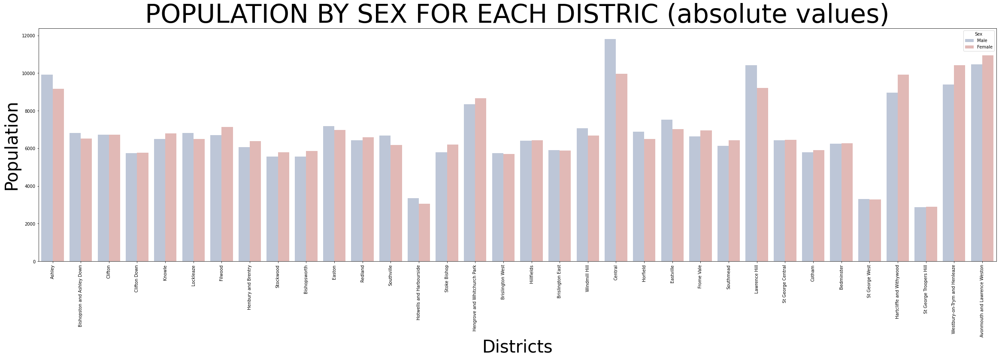

In [25]:
fig, ax = plt.subplots(figsize=(40,10))

g = sns.barplot(x = '2016 Ward Name', y = 'All Ages', data = pop_bysex_by_ward,
            hue = 'Sex',
            palette = 'vlag',
            capsize = 0.05,             
            saturation = 8,             
            errcolor = 'gray', errwidth = 2,  
            ci = 'sd',
            ax=ax,
            
            )

ax.set_xticklabels(g.get_xticklabels(), rotation=90) 
ax.set_title("POPULATION BY SEX FOR EACH DISTRIC (absolute values)",fontsize=60)
ax.set_xlabel('Districts', fontsize=40)
ax.set_ylabel('Population', fontsize=40)




Overall the male and the female population is equally distributed among the neighbourhoods.


## 2.2) Neighborhoods with airbnb highest prices

First, group by the column of neighbourhood to create a dataframe (neigh_df) which shows the mean of the AirBnB price for each unit (the most expansive neighbourhood is the "Granton South and Wardieburn", the least one is "Clovenstone and Wester Hailes").

Second, merge the the newf dataframe with the one of districts in order to create another dataframe (merged_df) on which to add columns regarding the centroid. It is necessary to first transform the projection into the pseudo-marcator one (epsg=3857). 

In [38]:
neigh_df = geodf.groupby(['neighbourhood_cleansed']).price.mean().to_frame('price').reset_index().sort_values(['price', 'neighbourhood_cleansed'], ascending=False)

merged_wpoly = geo_districts.merge(neigh_df, left_on = 'neighbourhood', right_on = 'neighbourhood_cleansed')

merged_df = geo_districts.merge(neigh_df, left_on = 'neighbourhood', right_on = 'neighbourhood_cleansed')


#add columns to the  merged_df
merged_df['centroid'] = merged_df.to_crs(epsg = 3857).geometry.centroid
merged_df['centroid'] = merged_df.centroid.to_crs(epsg = 4326)
merged_df['x'] = merged_df.centroid.x
merged_df['y'] = merged_df.centroid.y

#remove useless columns 
merged_wpoly = merged_wpoly[['neighbourhood','geometry','price']]
merged_df = merged_df[["neighbourhood","geometry","price","centroid","x","y"]] 


#NB here x is LONGITUDE, y is LATITUDE


<ipython-input-38-839078712d4c>:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  merged_df['centroid'] = merged_df.centroid.to_crs(epsg = 4326)
<ipython-input-38-839078712d4c>:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  merged_df['x'] = merged_df.centroid.x
<ipython-input-38-839078712d4c>:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  merged_df['y'] = merged_df.centroid.y


In [39]:
neigh_df.head()

,neighbourhood_cleansed,price
5,Brislington East,126.400000
20,Hotwells & Harbourside,117.262295
8,Clifton,110.683761
31,Stoke Bishop,107.400000
0,Ashley,105.919255


In [40]:
merged_wpoly.head()

,neighbourhood,geometry,price
0,Windmill Hill,"MULTIPOLYGON (((-2.60518 51.43439, -2.60484 51...",104.166667
1,Filwood,"MULTIPOLYGON (((-2.60773 51.43330, -2.60717 51...",98.444444
2,Southmead,"MULTIPOLYGON (((-2.61573 51.50247, -2.61529 51...",41.785714
3,Easton,"MULTIPOLYGON (((-2.56793 51.46887, -2.56787 51...",57.212121
4,Brislington East,"MULTIPOLYGON (((-2.55795 51.44962, -2.55785 51...",126.400000


In [41]:
merged_df.head()

,neighbourhood,geometry,price,centroid,x,y
0,Windmill Hill,"MULTIPOLYGON (((-2.60518 51.43439, -2.60484 51...",104.166667,POINT (-2.58594 51.43910),-2.585944,51.439097
1,Filwood,"MULTIPOLYGON (((-2.60773 51.43330, -2.60717 51...",98.444444,POINT (-2.59280 51.42542),-2.592803,51.425419
2,Southmead,"MULTIPOLYGON (((-2.61573 51.50247, -2.61529 51...",41.785714,POINT (-2.60112 51.50306),-2.601118,51.503062
3,Easton,"MULTIPOLYGON (((-2.56793 51.46887, -2.56787 51...",57.212121,POINT (-2.55851 51.46237),-2.558506,51.462372
4,Brislington East,"MULTIPOLYGON (((-2.55795 51.44962, -2.55785 51...",126.400000,POINT (-2.53865 51.44028),-2.538654,51.440284


#### Choropleth map (by districts)
Plot a choropleth map in order to better visualize the districts with higher airbnb prices

In [43]:
fig_price =Figure(width=550,height=350)
map_price =folium.Map(location=point_city,tiles='cartodbpositron',zoom_start=10.5)


choropleth = folium.Choropleth(
    geo_data=merged_wpoly,
    data = merged_wpoly,
    columns=['neighbourhood', 'price'],
    key_on="feature.properties.neighbourhood",
    fill_color='Purples',
    fill_opacity=0.9, 
    line_opacity=1,
    legend_name='Price',
    smooth_factor=0).add_to(map_price)

fig_price.add_child(map_price)

# Display Region Label
folium.LayerControl().add_to(map_price)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['neighbourhood'], labels=False)
)

map_price

#### Heatmap 
Plot a Heatmap of the most expensive airbnb in order to better visualize distribution of prices

In [44]:
data = merged_df[['y','x', 'price']] #needed information: coordinates and price

fig_heatmap_price =Figure(width=700,height=350)
heatmap_price = folium.Map(location=[point_city[0], point_city[1]],tiles='cartodbpositron',zoom_start=10.5)

HeatMap(data.values, name=None, min_opacity=0.6, max_zoom=18, max_val=1.0, radius=15, blur=10, gradient=None, overlay=True, control=True, show=True).add_to(heatmap_price)
fig_heatmap_price.add_child(heatmap_price)

fig_heatmap_price




# 3) Districts with the greatest number of tourist activities

To solve this exercise I need to use the openstreetmap libraries for python (such as pyrosm). 
Firstly, I check whether Edinburgh is available, then I proceed with the analysis. 


In [30]:
sources.europe.available
sources.cities.Bristol #download from the url or directly use it in the next junk

{'name': 'Bristol.osm.pbf',
 'url': 'https://download.bbbike.org/osm/bbbike/Bristol/Bristol.osm.pbf'}

Then, using the tags "tourism" I filter  the data. 

In [31]:
# create the bounding box needed
bbox_geom = geo_districts.geometry.unary_union

# pyrosm library and the previously created bounding box
osm = pyrosm.OSM("Bristol.osm.pbf",bounding_box=bbox_geom)


osm.conf.tags.available # pick tourism


# filter and get the right points
custom_filter = {'tourism': True}
pois = osm.get_pois(custom_filter=custom_filter)


# Gather info about points type
pois["type"] = pois["tourism"]
pois["type"] = pois["type"].fillna(pois["tourism"])



#### Plot  point of tourism

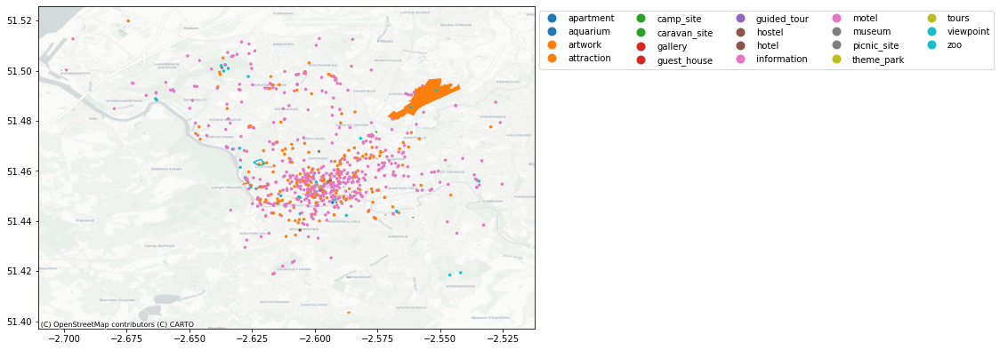

In [32]:
# add background
ax = pois.plot(column='type', markersize=6, figsize=(10,10), 
               legend=True, legend_kwds=dict(loc='upper left', ncol=5, bbox_to_anchor=(1, 1)))
ctx.add_basemap(ax, crs=geodf.crs.to_string(), source=ctx.providers.CartoDB.Positron)

In [33]:
#fix the pois geodataframe 

pois['centroid'] = pois.geometry.centroid

pois['latitude'] = pois.geometry.centroid.y
pois['longitude'] = pois.geometry.centroid.x

pois.head(3)

<ipython-input-33-22bdd99affe9>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pois['centroid'] = pois.geometry.centroid
<ipython-input-33-22bdd99affe9>:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pois['latitude'] = pois.geometry.centroid.y
<ipython-input-33-22bdd99affe9>:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pois['longitude'] = pois.geometry.centroid.x


,timestamp,changeset,version,lat,tags,id,lon,addr:city,addr:housenumber,addr:housename,...,tourism,geometry,osm_type,addr:country,attraction,museum,type,centroid,latitude,longitude
0,0,0.0,0,51.457359,None,26009713,-2.627774,None,None,None,...,viewpoint,POINT (-2.62777 51.45736),node,NaN,NaN,NaN,viewpoint,POINT (-2.62777 51.45736),51.457359,-2.627774
1,0,0.0,0,51.456978,None,26009714,-2.627786,None,None,None,...,viewpoint,POINT (-2.62779 51.45698),node,NaN,NaN,NaN,viewpoint,POINT (-2.62779 51.45698),51.456978,-2.627786
2,0,0.0,0,51.456364,None,26009717,-2.626978,None,None,None,...,viewpoint,POINT (-2.62698 51.45636),node,NaN,NaN,NaN,viewpoint,POINT (-2.62698 51.45636),51.456364,-2.626978


#### Webmapping  (clusters)

In order to better see the number and the location of point of tourism, I used the cluster plugin of Folium.

In [35]:
fig_tourism = Figure(width=500,height=300)
map_tourism =folium.Map(location=[point_city[0], point_city[1]],tiles='cartodbpositron',zoom_start=11) 

# marker cluster
marker_cluster = MarkerCluster().add_to(map_tourism)

# specify the markers also using the previously defined function getMarker 
for index, row in pois.iterrows():
    icon=folium.Icon(color='purple',prefix='fa',icon='arrow-circle-down')
    message = '<strong>name: '+ str(row['name']) 
    tip = message + '<br/>'
    marker = getMarker(row['latitude'],row['longitude'],message, tip, iconstyle=None)
    #add to marker cluster 
    marker.add_to(marker_cluster)

# add to figure and plot
fig_tourism.add_child(map_tourism)
map_tourism





Now perform a spatial join between pois e geodf in order to see what are the districts with more tourism activities. Then I need to use the groupby function to see better results. 


In [36]:
distr_and_tourism = gpd.sjoin(geo_districts, 
                          pois, how='inner', op='contains', lsuffix='macroregions_', rsuffix='libraries_')


distr_and_tourism = distr_and_tourism.groupby(['neighbourhood']).geometry.count().to_frame('tourism_counter').reset_index().sort_values(['tourism_counter', 'neighbourhood'], ascending=False)
distr_and_tourism.head() 

,neighbourhood,tourism_counter
7,Central,243
18,Hotwells & Harbourside,107
19,Lawrence Hill,70
0,Ashley,55
8,Clifton,53


As expected, the "Central" district is the one with more tourist activities (n=243).

# 4) Find the location of 3 AirBnB hosts closest to one of the city's museums on walking distance 

Chosen museum: **The Red Lodge**

In [37]:
# find the coords of the National Museum of Scotland using Nominatim
geolocator = Nominatim(user_agent="Mozilla/5.0 (Linux; Android 10) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Mobile Safari/537.36")

location = geolocator.geocode("The Red Lodge Museum, Bristol")
point_museum = (location.latitude, location.longitude)

point_museum #show them 

(51.455441, -2.5995614977157366)

In order to identify the shortest path between the National Museum of Scotland and three AirBnBs I have to connect the point to the graph. 


In [39]:
def get_clostest_point(G, point):
    return ox.get_nearest_node(G, (point.y, point.x))

geodf['nearest_point'] = geodf['geometry'].apply(lambda p: get_clostest_point(G,p))

Defines the dictionary containing speeds for different vehicles or way to move(in km/h). Set low values to all those elements that cannot be walked by people in order to select them rather than others.

In [40]:
hwy_walking_speeds = {
    'motorway ': 0.5,
    'trunk': 0.5,
    'primary': 0.5,
    'secondary': 0.5,
    'tertiary': 0.5,
    'unclassified': 3.5,
    'residential': 3.5,
    'service': 3.5,
    'crossing': 3.5,
    'pedestrian': 3.5,
    'living_street':3.5,
    'steps':3.5,
    'footway': 3.5,
    'track':3.5}

G = ox.add_edge_speeds(G,hwy_speeds=hwy_walking_speeds)
G = ox.add_edge_travel_times(G)


In [41]:
# the id of the museum on openstreetmap
point_nearest_museum = ox.get_nearest_node(G, point_museum)
point_nearest_museum # id (openstreetmap)

2043128848

In [42]:
geodf['route_from_museum'] = geodf.nearest_point.apply(lambda to_point: ox.shortest_path(G, point_nearest_museum, to_point))


Set of functions to compute distances and time distances.

In [43]:
def geometry_from_route(inG,route):
    points = []
    for idnode in route:
        lon = inG.nodes[idnode]['x']
        lat = inG.nodes[idnode]['y']
        point = Point(lon,lat)
        points.append(point)
    return(LineString(points))


def travel_time_from_museum(inG, route):
    edge_times = ox.utils_graph.get_route_edge_attributes(inG, route, 'travel_time')
    return (sum(edge_times))


def lenght_path_from_museum(inG, route):
    edge_lengths = ox.utils_graph.get_route_edge_attributes(inG, route, 'length')
    return (sum(edge_lengths))


In [44]:
geodf['linestring'] = geodf.route_from_museum.apply(lambda route: geometry_from_route(G,route))
geodf['travel_time_from_museum'] = geodf.route_from_museum.apply(lambda route: travel_time_from_museum(G,route))
geodf['lenght_path_from_museum'] = round(geodf.route_from_museum.apply(lambda route: lenght_path_from_museum(G,route)),1)


In [164]:
geodf.head()

,id,name,neighbourhood_cleansed,latitude,longitude,price,geometry,nearest_point,route_from_museum,linestring,travel_time_from_museum,lenght_path_from_museum,haversine_distance_to_museum
0,70820,City View - Sarah's double room.,Windmill Hill,51.43994,-2.59173,30.0,POINT (-2.59173 51.43994),27231564,"[2043128848, 1058156221, 1692451170, 169245116...","LINESTRING (-2.599712 51.4555941, -2.599566 51...",967.0,2470.4,1822.2
1,117122,City Centre-Waterside Retreat,Clifton,51.45051,-2.61054,66.0,POINT (-2.61054 51.45051),26190518,"[2043128848, 2267242235, 6388293856, 368344901...","LINESTRING (-2.599712 51.4555941, -2.6001232 5...",866.9,1124.9,947.0
2,176306,The White Room - Central Bristol Art House Ga...,Bedminster,51.44101,-2.60121,29.0,POINT (-2.60121 51.44101),26372870,"[2043128848, 1058156221, 1692451170, 169245116...","LINESTRING (-2.599712 51.4555941, -2.599566 51...",1208.5,2509.4,1621.8
3,307634,Peaceful Safe Home & Clear Space 'The Lilac Room',Easton,51.46641,-2.55533,30.0,POINT (-2.55533 51.46641),243678484,"[2043128848, 1692451184, 1692451188, 113051994...","LINESTRING (-2.599712 51.4555941, -2.599546 51...",1301.2,3856.7,3332.4
4,322906,HUGE Room CENTRAL location House,Ashley,51.46668,-2.58274,69.0,POINT (-2.58274 51.46668),3329762969,"[2043128848, 1692451184, 1692451188, 169245119...","LINESTRING (-2.599712 51.4555941, -2.599546 51...",467.8,1911.4,1724.7


Three nearest AirBnB to the "Red Lodge Museum"  

In [46]:
geodf.sort_values(by=['lenght_path_from_museum']).head(15)[['name','lenght_path_from_museum']]


,name,lenght_path_from_museum
346,Lower Park Apartment Studio 2,20.5
344,Lower Park Row Apartments - Studio 4,20.5
347,Lower Park Row Apartments - Studio 7,20.5
345,Lower Park Ro Apartments- Studio 5,20.5
341,Lower Park Apartments Studio 1 - Hopewell,20.5
305,Lower Park Row Apartments- Studio 8,20.5
306,Lower Park Row Apartments- Studio 9,20.5
342,Lower Park Row Apartments - Studio 6,20.5
399,Lower Park Apartments Studio 10,20.5
606,CENTRAL - FREE PARKING - STYLISH APT - SPOTLESS,67.9


However, there are several AirBnB located in the same building ("Lower Park Apartment"), so I count them as once. For this reason, the actual number of AirBnB is greater than three. 

In [47]:
sum(geodf.lenght_path_from_museum<92)

11

As seen above, the total rows are 11, but the three nearest AirBnB are: 
- Lower Park Apartment (several "studios")
- Central free parking Stylish Apartment
- Super space in the heart of Bristol very central 

They are in the "Central" neighbourhood.

In [48]:
# create a df of the three nearest AirBnB 
geodf_3AirBnB = geodf[geodf.lenght_path_from_museum<=92].sort_values(by=['lenght_path_from_museum'])
geodf_3AirBnB

,id,name,neighbourhood_cleansed,latitude,longitude,price,geometry,nearest_point,route_from_museum,linestring,travel_time_from_museum,lenght_path_from_museum
305,16921208,Lower Park Row Apartments- Studio 8,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
306,16921595,Lower Park Row Apartments- Studio 9,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
341,17873393,Lower Park Apartments Studio 1 - Hopewell,Central,51.45570,-2.59939,67.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
342,17873565,Lower Park Row Apartments - Studio 6,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
344,17875182,Lower Park Row Apartments - Studio 4,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
345,17875273,Lower Park Ro Apartments- Studio 5,Central,51.45570,-2.59940,56.0,POINT (-2.59940 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
346,17875408,Lower Park Apartment Studio 2,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
347,17875494,Lower Park Row Apartments - Studio 7,Central,51.45570,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
399,19838468,Lower Park Apartments Studio 10,Central,51.45570,-2.59940,56.0,POINT (-2.59940 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
606,24562587,CENTRAL - FREE PARKING - STYLISH APT - SPOTLESS,Central,51.45543,-2.59924,90.0,POINT (-2.59924 51.45543),1692451180,"[2043128848, 1692451184, 1692451180]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",7.6,67.9


In [49]:
wgs84 = pyproj.CRS('EPSG:4326')
utm32n = pyproj.CRS('EPSG:32632')
projection_transform = pyproj.Transformer.from_crs(wgs84, utm32n, always_xy=False).transform

shapely_point_museum = Point(point_museum)

point_museum_utm32n = transform(projection_transform,shapely_point_museum)

geodf['haversine_distance_to_museum'] = round(geodf.geometry.to_crs(epsg=32632).representative_point().distance(point_museum_utm32n),1)


In [50]:
# show the first 3 by haversine distance 
geodf.sort_values(by=['haversine_distance_to_museum']).head(15)[['name','haversine_distance_to_museum']]

,name,haversine_distance_to_museum
606,CENTRAL - FREE PARKING - STYLISH APT - SPOTLESS,22.5
399,Lower Park Apartments Studio 10,31.2
345,Lower Park Ro Apartments- Studio 5,31.2
341,Lower Park Apartments Studio 1 - Hopewell,31.4
306,Lower Park Row Apartments- Studio 9,31.4
346,Lower Park Apartment Studio 2,31.4
347,Lower Park Row Apartments - Studio 7,31.4
342,Lower Park Row Apartments - Studio 6,31.4
344,Lower Park Row Apartments - Studio 4,31.4
305,Lower Park Row Apartments- Studio 8,31.4


In [51]:
geodf_3AirBnB.head(3)

,id,name,neighbourhood_cleansed,latitude,longitude,price,geometry,nearest_point,route_from_museum,linestring,travel_time_from_museum,lenght_path_from_museum
305,16921208,Lower Park Row Apartments- Studio 8,Central,51.4557,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
306,16921595,Lower Park Row Apartments- Studio 9,Central,51.4557,-2.59939,56.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5
341,17873393,Lower Park Apartments Studio 1 - Hopewell,Central,51.4557,-2.59939,67.0,POINT (-2.59939 51.45570),1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",2.3,20.5


##### Data visualisation
Webmapping the three nearest AirBnB and the museum (with Folium)

In [114]:
points_3AirBnB = geodf_3AirBnB[['name','geometry', 'travel_time_from_museum','lenght_path_from_museum', 'latitude','longitude']].set_geometry("geometry")
points_3AirBnB

y = points_3AirBnB.geometry.unary_union.centroid.y
x = points_3AirBnB.geometry.unary_union.centroid.x
geojson = points_3AirBnB.to_json()

fig_museum = Figure(width=500,height=300)
map_museum =folium.Map(location=[point_city[0], point_city[1]],zoom_start=16) 

folium.GeoJson(geojson).add_to(map_museum)
folium.GeoJson(Point([point_museum[1], point_museum[0]])).add_to(map_museum)



for index, row in points_3AirBnB.iterrows():
    
    marker = getMarker(row['latitude'],row['longitude'],row['lenght_path_from_museum'],row['name'], iconstyle=None)
    # use the function getMarker defined above (ex.3)
    
    marker.add_to(map_museum)


marker = folium.Marker(location=[point_museum[0],point_museum[1]], icon=folium.Icon(color='red',prefix='fa',icon='landmark'))
marker.add_to(map_museum)


map_museum




In [102]:
points_3AirBnB

,name,geometry,travel_time_from_museum,lenght_path_from_museum,latitude,longitude
305,Lower Park Row Apartments- Studio 8,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
306,Lower Park Row Apartments- Studio 9,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
341,Lower Park Apartments Studio 1 - Hopewell,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
342,Lower Park Row Apartments - Studio 6,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
344,Lower Park Row Apartments - Studio 4,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
345,Lower Park Ro Apartments- Studio 5,"POLYGON ((-304365.963 5764597.981, -304367.408...",2.3,20.5,51.45570,-2.59940
346,Lower Park Apartment Studio 2,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
347,Lower Park Row Apartments - Studio 7,"POLYGON ((-304365.271 5764597.870, -304366.716...",2.3,20.5,51.45570,-2.59939
399,Lower Park Apartments Studio 10,"POLYGON ((-304365.963 5764597.981, -304367.408...",2.3,20.5,51.45570,-2.59940
606,CENTRAL - FREE PARKING - STYLISH APT - SPOTLESS,"POLYGON ((-304359.697 5764566.321, -304361.142...",7.6,67.9,51.45543,-2.59924


# 5) 

## 5.1) Of the three hosts, identify which one has the greatest number of services (supermarkets, pharmacies, restaurants) in an area of 300m.


With pyrosm filter the services of Bristol in order to pick up supermarkets, phamarcies and restaurants.

In [54]:
bbox_geom = geo_districts.geometry.unary_union #same as before
osm = pyrosm.OSM("Bristol.osm.pbf",bounding_box=bbox_geom) #same as before 

osm.conf.tags.available

custom_filter = {'shop': ['supermarket'], 'amenity': ['restaurant', 'pharmacy']}
# prima: custom_filter = {'shop': ['supermarket', 'chemist'], 'amenity': ['restaurant', 'pharmacy']}
services = osm.get_pois(custom_filter=custom_filter)


In [55]:
services.head(4)

,timestamp,changeset,version,lat,tags,id,lon,addr:city,addr:housenumber,addr:housename,...,building,building:levels,source,geometry,osm_type,addr:country,organic,internet_access,start_date,wikipedia
0,0,0.0,0,51.470078,"{""addr:suburb"":""Easton"",""source:addr"":""FHRS Op...",319089152,-2.564680,Bristol,442-450,None,...,None,None,None,POINT (-2.56468 51.47008),node,NaN,NaN,NaN,NaN,NaN
1,0,0.0,0,51.432167,None,489663369,-2.554506,None,None,None,...,None,None,None,POINT (-2.55451 51.43217),node,NaN,NaN,NaN,NaN,NaN
2,0,0.0,0,51.462189,None,633398615,-2.522307,Kingswood,137-145,None,...,None,None,None,POINT (-2.52231 51.46219),node,NaN,NaN,NaN,NaN,NaN
3,0,0.0,0,51.468197,None,687445358,-2.517292,None,None,None,...,None,None,None,POINT (-2.51729 51.46820),node,NaN,NaN,NaN,NaN,NaN


With the buffer filter all the above selected services within a range of 300m.

In [56]:
services_in_area = services.to_crs(epsg=32632)
geodf_3AirBnB = geodf_3AirBnB.to_crs(epsg=32632)
geodf_3AirBnB['geometry'] = geodf_3AirBnB.buffer(300)


In [136]:
services300m_from_AirBnB = gpd.sjoin(geodf_3AirBnB,services_in_area, how='inner', op='contains', rsuffix='pharmacy')
services300m_from_AirBnB.head()

,id_left,name_left,neighbourhood_cleansed,latitude,longitude,price,geometry,nearest_point,route_from_museum,linestring,...,amenity,building,building:levels,source,osm_type,addr:country,organic,internet_access,start_date,wikipedia
305,16921208,Lower Park Row Apartments- Studio 8,Central,51.4557,-2.59939,56.0,"POLYGON ((-304365.271 5764597.870, -304366.716...",1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",...,restaurant,retail,None,None,way,None,None,None,None,None
306,16921595,Lower Park Row Apartments- Studio 9,Central,51.4557,-2.59939,56.0,"POLYGON ((-304365.271 5764597.870, -304366.716...",1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",...,restaurant,retail,None,None,way,None,None,None,None,None
341,17873393,Lower Park Apartments Studio 1 - Hopewell,Central,51.4557,-2.59939,67.0,"POLYGON ((-304365.271 5764597.870, -304366.716...",1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",...,restaurant,retail,None,None,way,None,None,None,None,None
342,17873565,Lower Park Row Apartments - Studio 6,Central,51.4557,-2.59939,56.0,"POLYGON ((-304365.271 5764597.870, -304366.716...",1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",...,restaurant,retail,None,None,way,None,None,None,None,None
344,17875182,Lower Park Row Apartments - Studio 4,Central,51.4557,-2.59939,56.0,"POLYGON ((-304365.271 5764597.870, -304366.716...",1692451188,"[2043128848, 1692451184, 1692451188]","LINESTRING (-2.599712 51.4555941, -2.599546 51...",...,restaurant,retail,None,None,way,None,None,None,None,None


In [138]:
services300m_from_AirBnB = services300m_from_AirBnB[['name_left','neighbourhood_cleansed','latitude','longitude','price','geometry','nearest_point','route_from_museum','travel_time_from_museum','lenght_path_from_museum']]

In [155]:
services300m_from_AirBnB = services300m_from_AirBnB.rename(columns={'name_left':'name'})
services300m_from_AirBnB.columns

Index(['name', 'neighbourhood_cleansed', 'latitude', 'longitude', 'price',
       'geometry', 'nearest_point', 'route_from_museum',
       'travel_time_from_museum', 'lenght_path_from_museum'],
      dtype='object')

**Group by name** of AirBnB to count the number of selected services within 300m.

In [148]:
count_services_by_district = services300m_from_AirBnB.groupby('name_left').size().to_frame("count").sort_values(['count', 'name_left'], ascending=[False,True])
count_services_by_district

,count
name_left,
CENTRAL - FREE PARKING - STYLISH APT - SPOTLESS,29
Lower Park Apartment Studio 2,25
Lower Park Apartments Studio 1 - Hopewell,25
Lower Park Row Apartments - Studio 4,25
Lower Park Row Apartments - Studio 6,25
Lower Park Row Apartments - Studio 7,25
Lower Park Row Apartments- Studio 8,25
Lower Park Row Apartments- Studio 9,25
Lower Park Apartments Studio 10,24


"Central-Free parking-stylish apartment" is one of the previously selected airbnb with the highest number of services within 300m (n=29) 

## 5.2) Autocorrelation of price 

This part is first done in Python (data preparation); the second one is computed in R.

In [189]:
#data preparation for spatial regression of the residuals:

#pop_by_ward.head()
#geodf.head()
prova2 = geo_districts.merge(pop_by_ward, left_on='neighbourhood', right_on='ward_2016_n_x')
prova2 = prova2[['neighbourhood','geometry_x','population_']]

data_regression = prova2.merge(geodf, left_on='neighbourhood', right_on='neighbourhood_cleansed')
data_regression = data_regression[['neighbourhood','population_','name','latitude','longitude','price']]
data_regression.head()

,neighbourhood,population_,name,latitude,longitude,price
0,Windmill Hill,13751.0,City View - Sarah's double room.,51.43994,-2.59173,30.0
1,Windmill Hill,13751.0,"Private cosy flat, free road parking and garden",51.43808,-2.59473,54.0
2,Windmill Hill,13751.0,Victoria Park Studio,51.43848,-2.58816,39.0
3,Windmill Hill,13751.0,"City View, Woodburner or Blanket Box room.",51.44024,-2.59174,30.0
4,Windmill Hill,13751.0,Totterdown double room near Temple Mead's Station,51.44431,-2.58044,53.0


In [193]:
geo_data_regression = gpd.GeoDataFrame(
                data_regression,
                crs='EPSG:4326',
                geometry=gpd.points_from_xy(data_regression.latitude,data_regression.longitude))

geo_data_regression.to_file("geo_data_regression.shp") 


In [194]:
geo_data_regression

,neighbourhood,population_,name,latitude,longitude,price,geometry
0,Windmill Hill,13751.0,City View - Sarah's double room.,51.43994,-2.59173,30.0,POINT (51.43994 -2.59173)
1,Windmill Hill,13751.0,"Private cosy flat, free road parking and garden",51.43808,-2.59473,54.0,POINT (51.43808 -2.59473)
2,Windmill Hill,13751.0,Victoria Park Studio,51.43848,-2.58816,39.0,POINT (51.43848 -2.58816)
3,Windmill Hill,13751.0,"City View, Woodburner or Blanket Box room.",51.44024,-2.59174,30.0,POINT (51.44024 -2.59174)
4,Windmill Hill,13751.0,Totterdown double room near Temple Mead's Station,51.44431,-2.58044,53.0,POINT (51.44431 -2.58044)
...,...,...,...,...,...,...,...
1587,Westbury-on-Trym & Henleaze,19806.0,Bright & airy double room in leafy area of Bri...,51.49586,-2.63222,40.0,POINT (51.49586 -2.63222)
1588,Westbury-on-Trym & Henleaze,19806.0,Comfortable & Cosy Three Bed House,51.48530,-2.59882,99.0,POINT (51.48530 -2.59882)
1589,Westbury-on-Trym & Henleaze,19806.0,"Stunning Studio Flat in Westbury-on-Trym, BS9",51.48600,-2.61679,50.0,POINT (51.48600 -2.61679)
1590,Westbury-on-Trym & Henleaze,19806.0,Cosy single room in super area. Breakfast.,51.49140,-2.60336,40.0,POINT (51.49140 -2.60336)


## R session

In [195]:
%load_ext rpy2.ipython #run once to start working in R

OGR data source with driver: ESRI Shapefile 
Source: "/Users/elenazordan/Desktop/corsi ds/Geospatial/exam_bristol/wards", layer: "wards"
with 34 features
It has 4 fields
OGR data source with driver: ESRI Shapefile 
Source: "/Users/elenazordan/Desktop/corsi ds/Geospatial/exam_bristol/newgdf", layer: "newgdf"
with 1592 features
It has 10 fields
Integer64 fields read as strings:  id 


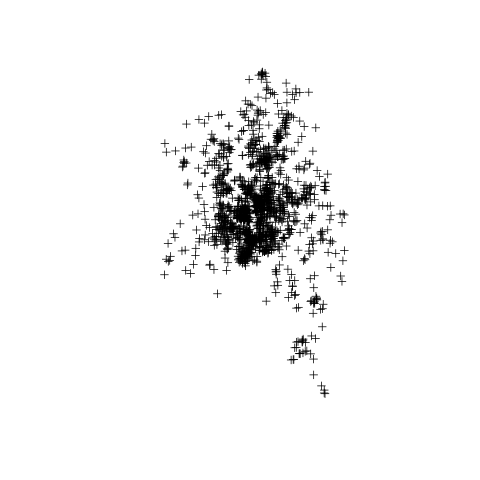

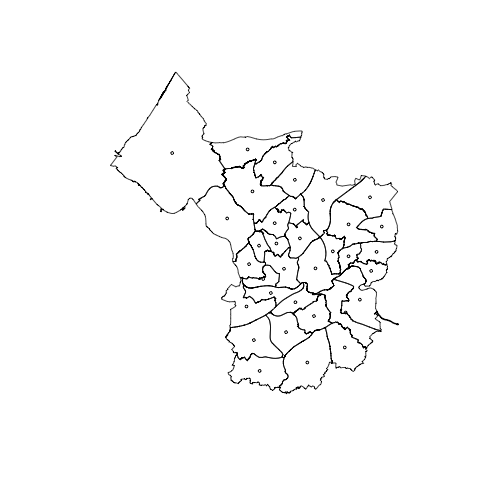

In [200]:
%%R 
# import df from global environment
# make default figure size 5 by 5 inches with 200 dpi resolution

library(spdep)
library(rgdal)

bristol <- readOGR("wards", "wards")
data <- readOGR("newgdf","newgdf")

coords <- coordinates(data) #computes the centroid
coords_bristol <- coordinates(bristol)

plot(data, border="blue") 
plot(bristol)

points(coords_bristol, cex=0.5)
points(coords, cex=0.5)

### CREATE THE SPATIAL WEIGHT MATRIX
First step that must be taken in order to proceed with spatial analysis and assess spatial autocorrelation of a variable

In [ ]:
%%R
# Defining spatial among spatial units:use the critical cut-off neighbourhood
# find the minimum threshold distance which allows each airbnb to have at least one neighbour
knn1IT <- knn2nb(knearneigh(coords,k=1,longlat=T))
all.linkedT <- max(unlist(nbdists(knn1IT, coords, longlat=T))) 
all.linkedT

The minimum threshold distance is equal to 1.63 km  

The cut-off distance has to be greater than 1.63km in order to avoid situations where there are no neighbours 
We can try different neighbourhood definitions for different values of the cut-off distance.

In [ ]:
%%R

dnb1.64 <- dnearneigh(coords, 0, 1.64, longlat=TRUE); dnb1.64
dnb3.5 <- dnearneigh(coords, 0, 3.5, longlat=TRUE); dnb3.5
dnb5 <- dnearneigh(coords, 0, 5, longlat=TRUE); dnb5
dnb10 <- dnearneigh(coords, 0, 10, longlat=TRUE); dnb10
dnb25 <- dnearneigh(coords, 0, 25, longlat=TRUE); dnb25


# the greater the distance is, the higher the number of link will be
plot(data,xlab="",ylab="",xlim=NULL)
title(main="d nearest neighbours, d = 1.64-3.5 km") 
#plot(dnb1.64, coords, add=TRUE, col="blue") #uncomment !warning: very slow!
#plot(dnb3.5, coords, add=TRUE, col="red") #uncomment !warning: very slow!


Create a row-standardized (style="W") spatial weights matrix for each critical cut-off neighbours 

In [ ]:
%%R
dnb1.64.listw <- nb2listw(dnb1.64,style="W") 
dnb3.5.listw <- nb2listw(dnb3.5,style="W")
dnb5.listw <- nb2listw(dnb5,style="W")
dnb10.listw <- nb2listw(dnb10,style="W")
dnb25.listw <- nb2listw(dnb25,style="W")

Build a free-form spatial weight matrices, in particular build weights as inverse functions of the distance among centroids: such that, higher is the distance, lower is the weight 

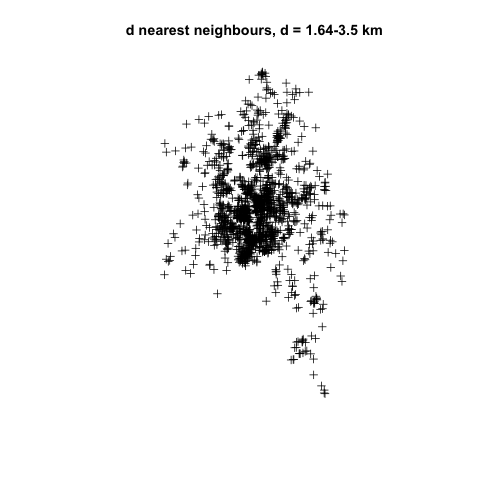

In [201]:
%%R

distM <- as.matrix(dist(coords)) #distance matrix across all the pair of units

# Three possible weight matrices (three different ways to make the inverse of the matrix)
W1 <- 1/(1+(distM)); diag(W1) <- 0
W2 <- 1/(1+distM)^2; diag(W2) <- 0
W3 <- exp(-distM^2); diag(W3) <- 0


#Row-standardize them 
W1s <- W1/rowSums(W1) 
W2s <- W1/rowSums(W2) 
W3s <- W1/rowSums(W3) 

#convert the weight matrix into a "listw" object for computational reasons
listW1s <- mat2listw(W1s)
listW2s <- mat2listw(W2s)
listW3s <- mat2listw(W3s)

### GLOBAL AUTOCORRELATION
Perform global Moran's I test of spatial autocorrelation by referring to the variable data$price, which is the price for each AirBnB



	Monte-Carlo simulation of Moran I

data:  data$price 
weights: dnb25.listw  
number of simulations + 1: 1000 

statistic = -0.00066002, observed rank = 9, p-value = 0.991
alternative hypothesis: greater



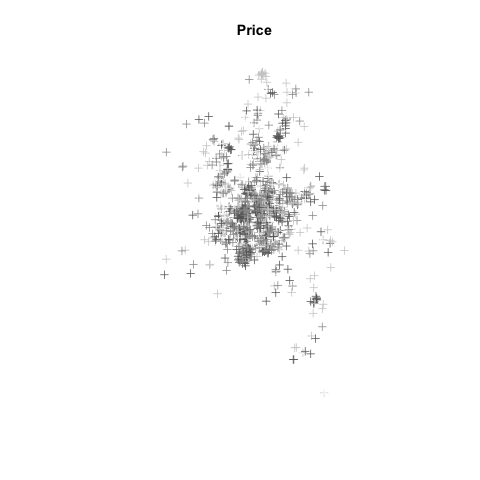

In [202]:
%%R

brks <- round(quantile(data$price), digits=5) #compute the quartile of the distribution of price
colours <- grey((length(brks):2)/length(brks)) #assign different naunces by quartiles
plot(data, col=colours[findInterval(data$price, brks, all.inside=TRUE)])
title(main="Price")

#perform the global Moran's I test 
moran.test(data$price, dnb1.64.listw, randomisation=FALSE) 
#reject H0 since the p-value is low, but also the value of the Moran's I index is very low
moran.test(data$price, dnb3.5.listw, randomisation=FALSE) 
#reject H0 (with a level of confidence of 95% ) but accept H0 with higher confidence levels
# always very low value for the Moran's I statistics 
moran.test(data$price, dnb5.listw, randomisation=FALSE) #accept H0: reject the hypothesis of autocorrelation
moran.test(data$price, dnb10.listw, randomisation=FALSE) #accept H0: reject the hypothesis of autocorrelation
moran.test(data$price, dnb25.listw, randomisation=FALSE) #accept H0: reject the hypothesis of autocorrelation





Perform again the global Moran's I test but with the assumption of randomisation, hence without the assumption of normality 

In [ ]:
%%R 
moran.test(data$price, dnb1.64.listw, randomisation=TRUE) 
# still reject H0, but also a very low value of the Moran's I statistic

# the next rows obtained results very similar to the ones computed previously without the randomisation assumption. 
moran.test(data$price, dnb3.5.listw, randomisation=TRUE) 
#reject H0 (with a level of confidence of 95% ) but accept H0 with higher confidence levels
# always very low value for the Moran's I statistics 
moran.test(data$price, dnb5.listw, randomisation=TRUE) #accept H0: reject the hypothesis of autocorrelation
moran.test(data$price, dnb10.listw, randomisation=TRUE) #accept H0: reject the hypothesis of autocorrelation
moran.test(data$price, dnb25.listw, randomisation=TRUE) #accept H0: reject the hypothesis of autocorrelation


Apply now a parametric bootstrap approach (and monte-carlo approach).

Also the next rows obtained results very similar to the ones computed previously. 

In [ ]:
%%R

moran.mc(data$price, dnb1.64.listw, nsim=999) #reject H0
moran.mc(data$price, dnb3.5.listw, nsim=999) #reject H0 (with a level of confidence of 95% ) but accept H0 with higher confidence levels
# always very low value for the Moran's I statistics 
moran.mc(data$price, dnb5.listw, nsim=999) #accept H0: reject the hypothesis of autocorrelation
moran.mc(data$price, dnb10.listw, nsim=999) #accept H0: reject the hypothesis of autocorrelation
moran.mc(data$price, dnb25.listw, nsim=999) #accept H0: reject the hypothesis of autocorrelation


### The Moran's I test of spatial autocorrelation in OLS residuals 

OGR data source with driver: ESRI Shapefile 
Source: "/Users/elenazordan/Desktop/corsi ds/Geospatial/exam_bristol/geo_data_regression", layer: "geo_data_regression"
with 1592 features
It has 6 fields


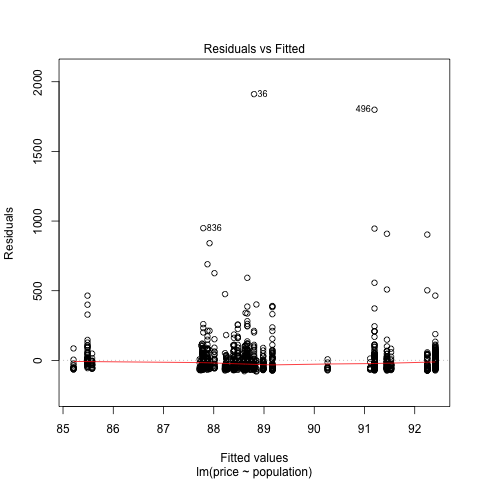

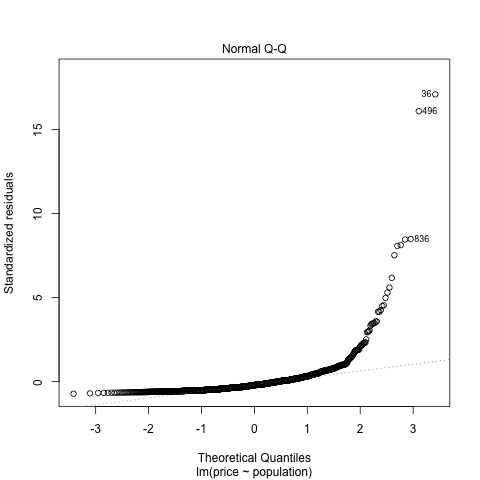

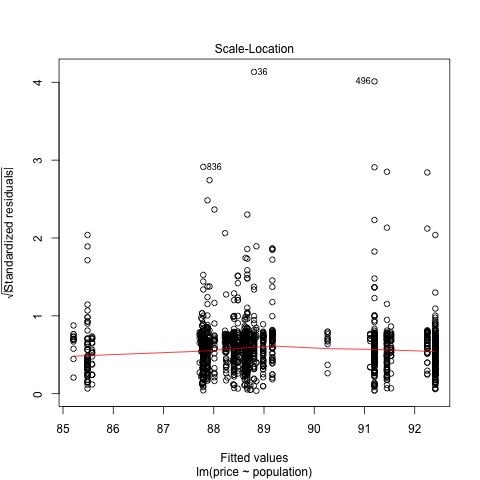

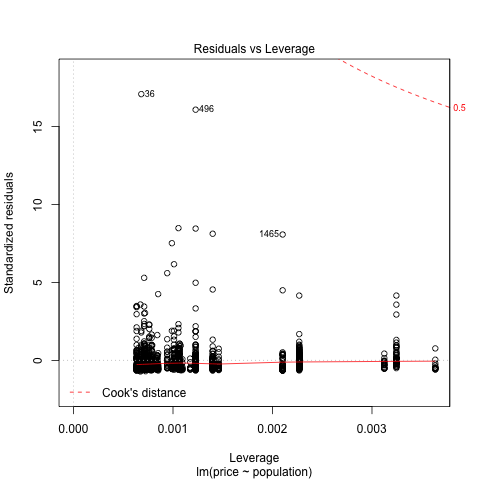

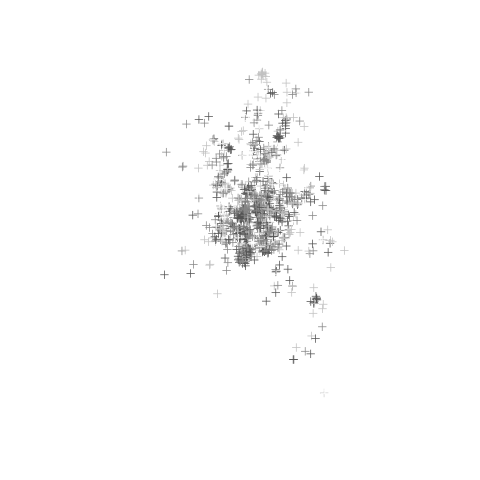

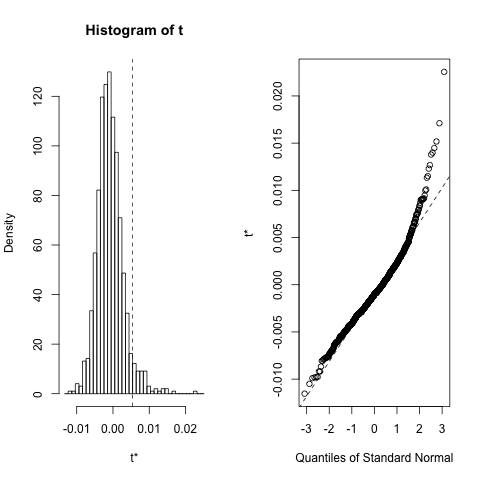

In [203]:
%%R

#load the needed data 
data_regression <- readOGR("geo_data_regression", "geo_data_regression")
coords <- coordinates(data_regression) #computes the centroid


#detect the presence of spatial autocorrelation in the residuals of a linear regression model. 
LinearSolow <- lm(price ~ population , data_regression)
summary(LinearSolow) 
plot(LinearSolow)

#The plot of the studentized residuals can give a hint 
#about the presence of spatial dependence in the residuals,
studres <- rstudent(LinearSolow)
resdistr <- quantile(studres) 
colours <- grey((length(resdistr):2)/length(resdistr))
plot(data_regression, col=colours[findInterval(studres, resdistr, all.inside=TRUE)])



The function lm.morantest() allows to perform the Moran's I test in the OLS residuals.

Apply the test to the studentized residuals of the linear Solow model, for different specifications of the spatial weights matrix:

In [209]:
%%R

lm.morantest(LinearSolow,dnb1.64.listw,resfun=rstudent)

#lm.morantest(LinearSolow,dnb3.5.listw,resfun=rstudent) #same as above, accept H0 
#lm.morantest(LinearSolow,dnb5.listw,resfun=rstudent) # same as above, accept H0


	Global Moran I for regression residuals

data:  
model: lm(formula = price ~ population, data = data_regression)
weights: dnb1.64.listw

Moran I statistic standard deviate = 1.3754, p-value = 0.08451
alternative hypothesis: greater
sample estimates:
Observed Moran I      Expectation         Variance 
    4.584130e-03    -7.690441e-04     1.514928e-05 



also with the cut-off distance the test is not significant at 95% level of confidence, since the p-value is greater than 0.05. In addition to that the Observed Moran'I is almost zero


Apply now the test under permutation bootstrap:

In [ ]:
%%R
library(boot)
LinearSolow.lmx <- lm(price ~ population , data_regression, x = TRUE)
MoraneI.boot <- function(var, i, ...) {
  var <- var[i]
  lmres <- lm(var ~ LinearSolow.lmx$x - 1)
  return(moran(x=residuals(lmres), ...)$I)	  
}
boot1 <- boot(residuals(LinearSolow.lmx),statistic=MoraneI.boot,  
              R=999, sim="permutation", listw=dnb1.64.listw,  
              n=length(dnb1.64.listw$neighbours), S0=Szero(dnb1.64.listw))
ti <- (boot1$t0 - mean(boot1$t))/sqrt(var(boot1$t))  
boot1
plot(boot1)
# as we can see, the underlying distribution is not so similar to a normal one


### DESCRIPTIVE SPATIAL STATISTICS - LOCAL ANALYSIS



First step: Moran Scatterplot

In [ ]:
%%R 

#use dnb1.64 as above 
mplot <- moran.plot(data$price, listw=dnb1.64.listw, main="Moran scatterplot", 
                    return_df=F)
grid()

As we can see, there is a light positive autocorrelation (slope)



Identify now the influential regions, which can be done for example by selecting the ones in the HH (high-high) quadrant. 

Then, comparing the values of _x_ and _wx_ we can assign each influential region to the proper Moran scatterplot quadrant.

Potentially influential observations of
	 lm(formula = wx ~ x) :

     dfb.1_ dfb.x   dffit   cov.r   cook.d hat    
22    0.00  -0.01   -0.01    1.00_*  0.00   0.00  
36    0.59  -1.03_* -1.03_*  1.22_*  0.53   0.18_*
68   -0.01   0.04    0.04    1.00_*  0.00   0.00_*
75   -0.01   0.02    0.02    1.01_*  0.00   0.01_*
84    0.00   0.01    0.01    1.02_*  0.00   0.02_*
111  -0.01   0.03    0.03    1.00_*  0.00   0.00  
141  -0.01   0.02    0.02    1.01_*  0.00   0.00_*
167  -0.01   0.03    0.03    1.01_*  0.00   0.01_*
175  -0.01   0.04    0.04    1.00_*  0.00   0.00  
197  -0.09   0.03   -0.10    0.98_*  0.00   0.00  
276  -0.01   0.04    0.04    1.00_*  0.00   0.00  
292   0.00   0.02    0.02    1.00_*  0.00   0.00  
357  -0.01   0.03    0.03    1.01_*  0.00   0.01_*
370   0.00   0.02    0.02    1.00_*  0.00   0.00  
382  -0.01   0.03    0.03    1.02_*  0.00   0.02_*
383   0.01  -0.02   -0.02    1.05_*  0.00   0.05_*
416   0.21  -0.36   -0.36_*  1.20_*  0.06   0.16_*
457   0.06  -0.0

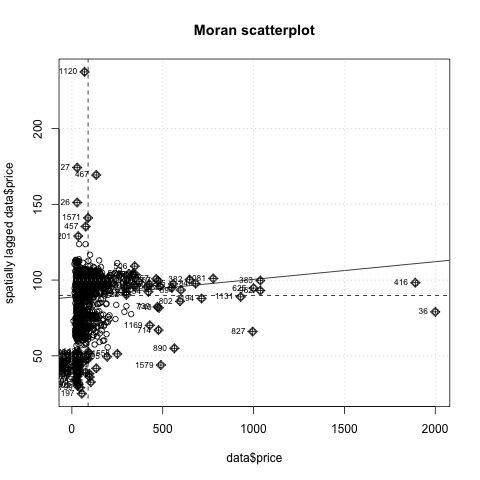

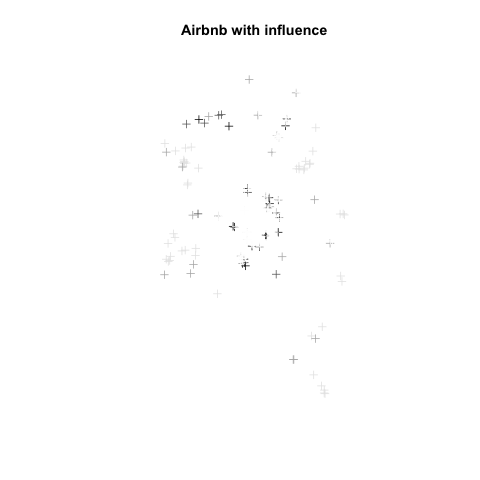

In [205]:
%%R

hotspot <- as.numeric(row.names(as.data.frame(summary(mplot))))
 
data$wx <- lag.listw(dnb1.64.listw, data$price)


data$quadrant <- rep("None", length(data$price))
for(i in 1:length(hotspot))  {
  if (data$price[hotspot[i]]>mean(data$price) & data$wx[hotspot[i]]> mean(data$wx)) 
    data$quadrant[hotspot[i]] <- "HH" 
  if (data$price[hotspot[i]]>mean(data$price) & data$wx[hotspot[i]]< mean(data$wx)) 
    data$quadrant[hotspot[i]] <- "HL" 
  if (data$price[hotspot[i]]<mean(data$price) & data$wx[hotspot[i]]<mean(data$wx)) 
    data$quadrant[hotspot[i]] <- "LL" 
  if (data$price[hotspot[i]]<mean(data$price) & data$wx[hotspot[i]]>mean(data$wx)) 
    data$quadrant[hotspot[i]] <- "LH" 
}

table(data$quadrant)



#Plot now the map of the influential airbnbs
data$colours[data$quadrant=="None"] <- "white" 
data$colours[data$quadrant=="HH"] <- "black" 
data$colours[data$quadrant=="LL"] <- gray(0.9) 
data$colours[data$quadrant=="LH"] <- gray(0.4)
data$colours[data$quadrant=="HL"] <- gray(0.7)
plot(data, col=data$colours)
title(main="Airbnb with influence")







#### The local Moran's I

The distribution of the local Moran's I index values may be represented graphically: 

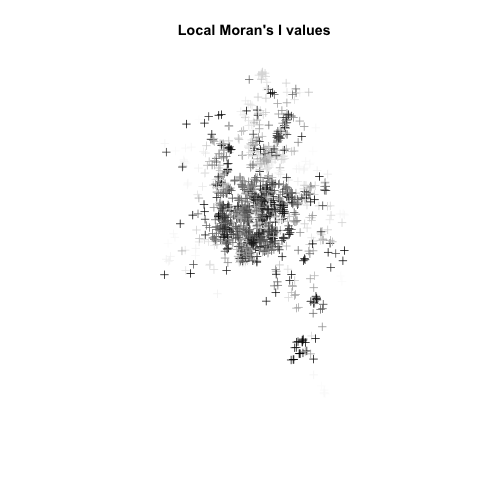

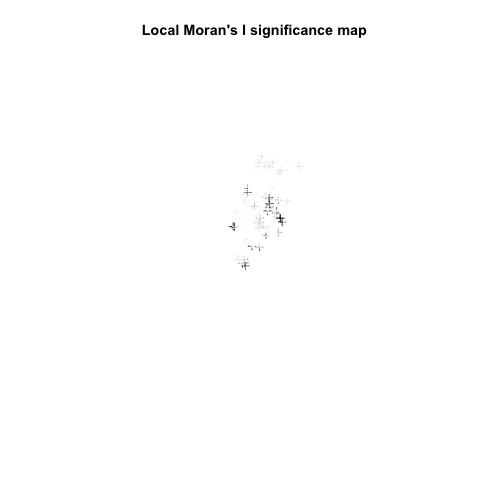

In [206]:
%%R 

lmI <- localmoran(data$price, dnb1.64.listw)
head(lmI)


brks <- sort(as.numeric(lmI[,1]))
colours <- grey((0:length(lmI[,1]))/length(lmI[,1]))
plot(data, col=colours[findInterval(lmI[,1], brks, all.inside=TRUE)])
title(main="Local Moran's I values")


#As with the global index, the local Moran's I statistics can be tested for 
#deviations using the hypothesis of absence of local spatial autocorrelation
pval <- as.numeric(lmI[,5])
data$colpval[pval>0.05] <- "white" 
data$colpval[pval<=0.05 & pval>0.01] <- gray(0.9) 
data$colpval[pval<=0.01 & pval>0.001] <- gray(0.7)
data$colpval[pval<=0.001 & pval>0.0001] <- gray(0.4)
data$colpval[pval<=0.0001] <- "black"

plot(data, col=data$colpval)
title(main="Local Moran's I significance map")


As it may seem, local Moran's I values are very low, suggesting no local autocorrelation.